In this notebook, We will build a structure for 'editing image with just prompt'. For this purpose, we will use 3 helpful and great models : Stable Diffusion , DINO and SAM.


We can easily explain our plan in 3 steps with relative models:

  * DINO is for : detecting object in the image wiit zero shot detection according to prompt

  * SAM is for : segmentation of the detected object which we need to apply a mask for inpainting it by diffusion model

  * Stable Diffusion is for : inpainting task. according to prompt it will make the changes with masked image.

# **Loading and importing Libraries, Models and Pretrained Weights**

Let's begin by loading related libraries,  models and pretrained weights.

We can load some of them with just a 'pip' command. Some of them should be downloaded from related git pages.



In [1]:
# ----install SAM, Stable Diffusion and libraries
!pip -q install diffusers transformers scipy segment_anything
# ------install GroundingDINO, DINO weights
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd GroundingDINO
!pip -q install -e .

## for SAM and DINO , download pretrained weights to 'weight' folder
%mkdir weights
%cd weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth
%cd ..

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 8.3 MB/s eta 0:00:00
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 426, done.
remote: Counting objects: 100% (193/193), done.
remote: Compressing objects: 100% (66/66), done.
remote: Total 426 (delta 147), reused 128 (delta 127), pack-reused 233
Receiving objects: 100% (426/426), 12.86 MiB | 12.10 MiB/s, done.
Resolving deltas: 100% (219/219), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 18.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 10.6 MB/s eta 0:00:00
/content/GroundingDINO/weights
/content/GroundingDINO


In [2]:
# ----SAM
from segment_anything import SamPredictor, sam_model_registry
# ----Stable Diffusion
from diffusers import StableDiffusionInpaintPipeline
# ----GroundingDINO
from groundingdino.util.inference import load_model, load_image, predict, annotate
from GroundingDINO.groundingdino.util import box_ops
# ----Extra Libraries
from PIL import Image
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np

Now we need to specify parameters and build models' pipelines. This notebook doesn't contain theorical explanation or details about models. If you are not familiar to use them , please make a quick search on net. In here , I will just show an easy use example.

You can change parameters, models and prompts for your task and have better results. BUT BE CAREFUL about downloading related models and weights!!

In [3]:
# set CUDA for faster process (GPU)
device = "cuda"



# SAM parameter
model_type = "vit_h"
predictor = SamPredictor(sam_model_registry[model_type](checkpoint="./weights/sam_vit_h_4b8939.pth").to(device=device))

# Stable Diffusion 2 inpainting pipeline
pipe = StableDiffusionInpaintPipeline.from_pretrained("stabilityai/stable-diffusion-2-inpainting", torch_dtype=torch.float16,).to(device)

# Grounding DINO for detection
groundingdino_model = load_model("groundingdino/config/GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")



## detection parameters
BOX_TRESHOLD = 0.3
TEXT_TRESHOLD = 0.25


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/544 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/638 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/914 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/829 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

define a function for showing mask after detection and segmentation.

Reminder : mask is not 3 channel !!

In [4]:
def show_mask(mask, image, random_color=True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.8])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

    annotated_frame_pil = Image.fromarray(image).convert("RGBA")
    mask_image_pil = Image.fromarray((mask_image.cpu().numpy() * 255).astype(np.uint8)).convert("RGBA")

    return np.array(Image.alpha_composite(annotated_frame_pil, mask_image_pil))

Let's begin with detection of the object by DINO.

Use 'predict' command... what about parameters:
  * model : DINO model
  * image : input image
  * caption : name of the object
  * box_threshold : Threshold for bbox
  * text_threshold : Threshold for phrases.



In [7]:
# load image
img_path = '/content/dog_1.JPG'
src, img = load_image(img_path)

In [8]:
#  prompt is for identifying target object in the image
TEXT_PROMPT = "dog"

In [9]:
boxes, logits, phrases = predict(
    model=groundingdino_model,
    image=img,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)
img_annnotated = annotate(image_source=src, boxes=boxes, logits=logits, phrases=phrases)[...,::-1]

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:993: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


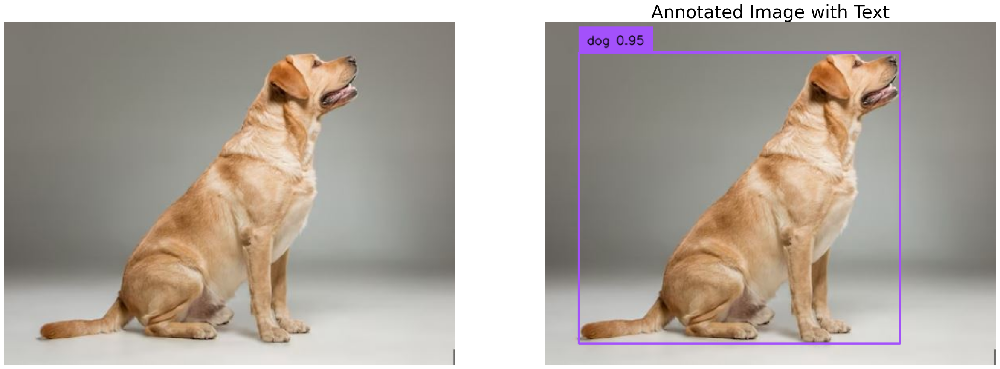

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Annotated Image with Text", fontsize=30)
axes[0].imshow(src)
axes[0].axis('off')
axes[1].imshow(img_annnotated)
axes[1].axis('off')

plt.show()

We find the object in image... Now we weill use this info (bounding box coordinates) for segmentation of object. And after segmentation we will prepare our mask for inpainting operation

In [11]:
predictor.set_image(src)
H, W, _ = src.shape
boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])
new_boxes = predictor.transform.apply_boxes_torch(boxes_xyxy, src.shape[:2]).to(device)

In [ ]:
"""
Generates masks from prompts on the set image.

Parameters:
- point_coords (Optional[torch.Tensor]): Point prompts in pixels.
- point_labels (Optional[torch.Tensor]): Labels for points (1: foreground, 0: background).
- boxes (Optional[np.ndarray]): Box prompts in XYXY format.
- mask_input (np.ndarray): Previous mask input.
- multimask_output (bool): Returns multiple masks for ambiguous prompts.
- return_logits (bool): Returns mask logits instead of binary masks.

Returns:
- masks (torch.Tensor): Output masks in BxCxHxW format.
- qualities (torch.Tensor): Quality predictions for each mask.
- logits (torch.Tensor): Low-res logits for next iteration.
"""

In [12]:
masks, _, _ = predictor.predict_torch(
            point_coords = None,
            point_labels = None,
            boxes = new_boxes,
            multimask_output = False,
        )

In [13]:
img_annotated_mask = Image.fromarray(show_mask(masks[0][0].cpu(), img_annnotated))
original_img = Image.fromarray(src).resize((512, 512))
img_annotated = Image.fromarray(img_annnotated)
only_mask = Image.fromarray(masks[0][0].cpu().numpy()).resize((512, 512))

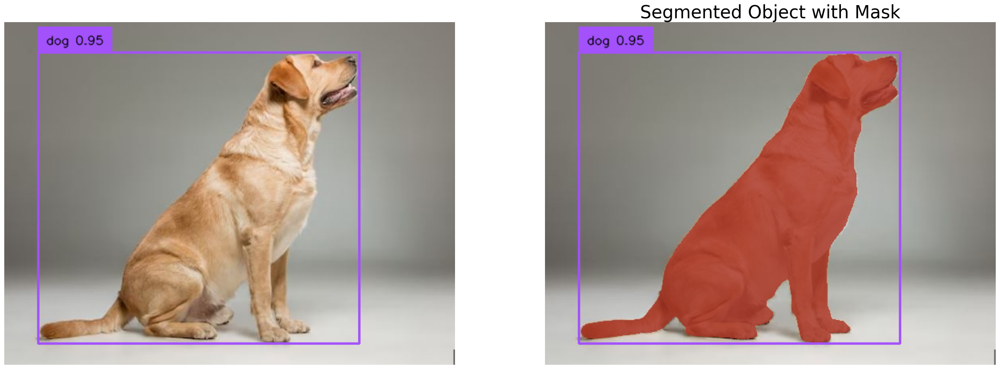

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Segmented Object with Mask", fontsize=30)
axes[0].imshow(img_annnotated)
axes[0].axis('off')
axes[1].imshow(img_annotated_mask)
axes[1].axis('off')
plt.show()

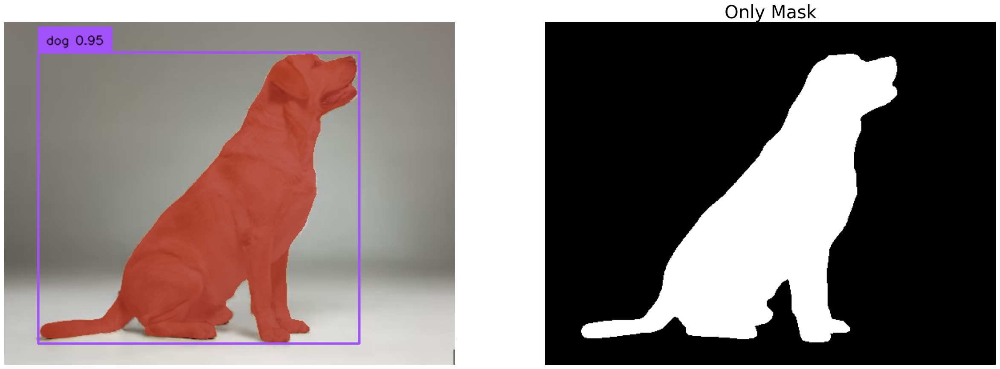

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Only Mask", fontsize=30)
axes[0].imshow(img_annotated_mask)
axes[0].axis('off')
axes[1].imshow(Image.fromarray(masks[0][0].cpu().numpy()))
axes[1].axis('off')

plt.show()

In [26]:
prompt = "a sculpture lion" #replace with this object
edited = pipe(prompt=prompt, image=original_img, mask_image=only_mask).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

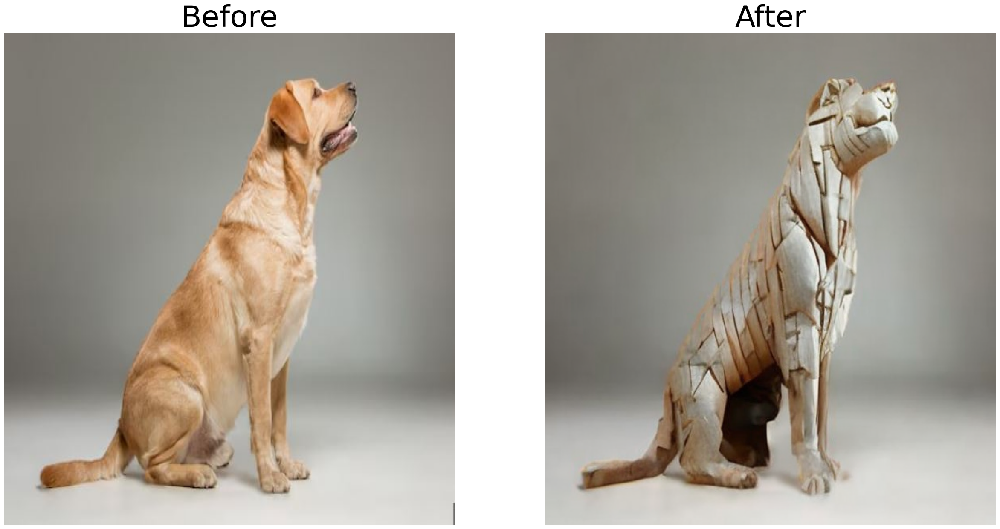

In [27]:
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(src)
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')
axes[1].imshow(edited)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()

Not bad, but of course not perfect... We don't dive into parameter of Stable diffusion models. By changing them, you can find much better results.

Let's write a much easier code block to apply this process easily for other examples

In [28]:
def process_boxes(boxes, src):
    H, W, _ = src.shape
    boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])
    return predictor.transform.apply_boxes_torch(boxes_xyxy, src.shape[:2]).to(device)

def edit_image(path, item, prompt, box_threshold, text_threshold):
    '''
    - path (str): Path to the image file
    - item (str): Item to be recognized in the image
    - prompt (str): Item to replace the selected object in the image
    - box_threshold (float): Threshold for the bounding box predictions.
    - text_threshold (float): Threshold for the text predictions.
    '''
    src, img = load_image(path)
    boxes, logits, phrases = predict(
        model=groundingdino_model,
        image=img,
        caption=item,
        box_threshold=box_threshold,
        text_threshold=text_threshold
    )
    predictor.set_image(src)
    new_boxes = process_boxes(boxes, src)
    masks, _, _ = predictor.predict_torch(
        point_coords=None,
        point_labels=None,
        boxes=new_boxes,
        multimask_output=False,
    )
    img_annotated_mask = show_mask(masks[0][0].cpu(),
        annotate(image_source=src, boxes=boxes, logits=logits, phrases=phrases)[...,::-1]
    )
    return pipe(prompt=prompt,
        image=Image.fromarray(src).resize((512, 512)),
        mask_image=Image.fromarray(masks[0][0].cpu().numpy()).resize((512, 512))
    ).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

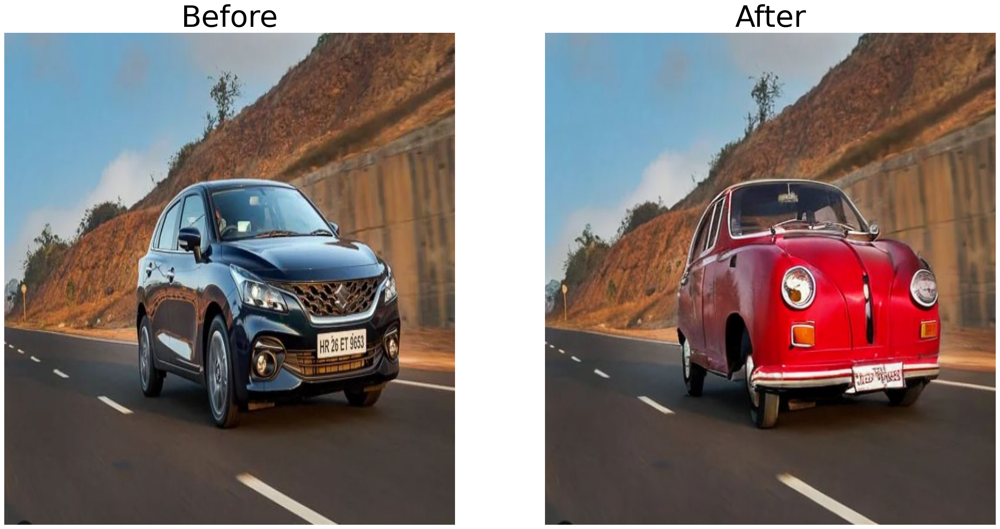

In [30]:
path = '/content/car_2.JPG'
edited_image = edit_image(path, "car", "red car", 0.5, 0.2)
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(plt.imread(path))
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')

axes[1].imshow(edited_image)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

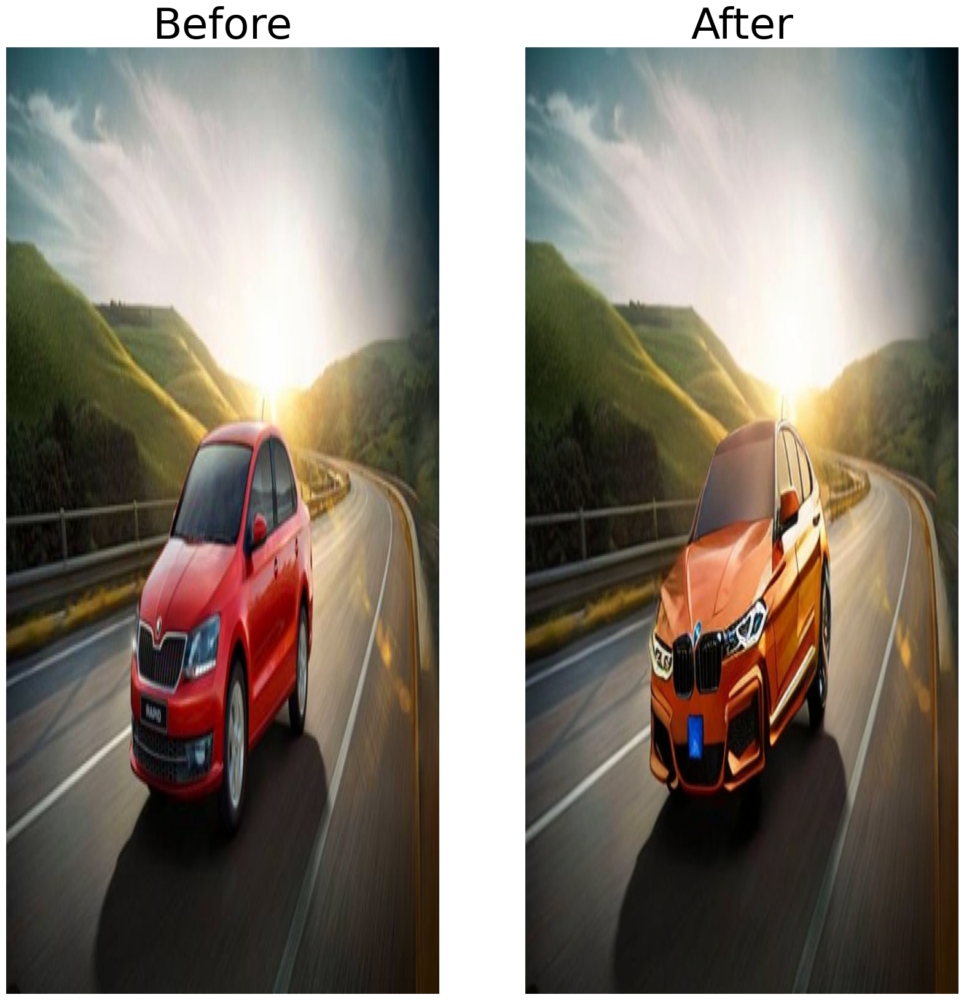

In [31]:
path = '/content/car_3.JPG'
edited_image = edit_image(path, "car", "a blue BMW", 0.5, 0.2)
fig, axes = plt.subplots(1, 2, figsize=(20, 20))

axes[0].imshow(plt.imread(path))
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')

axes[1].imshow(edited_image)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

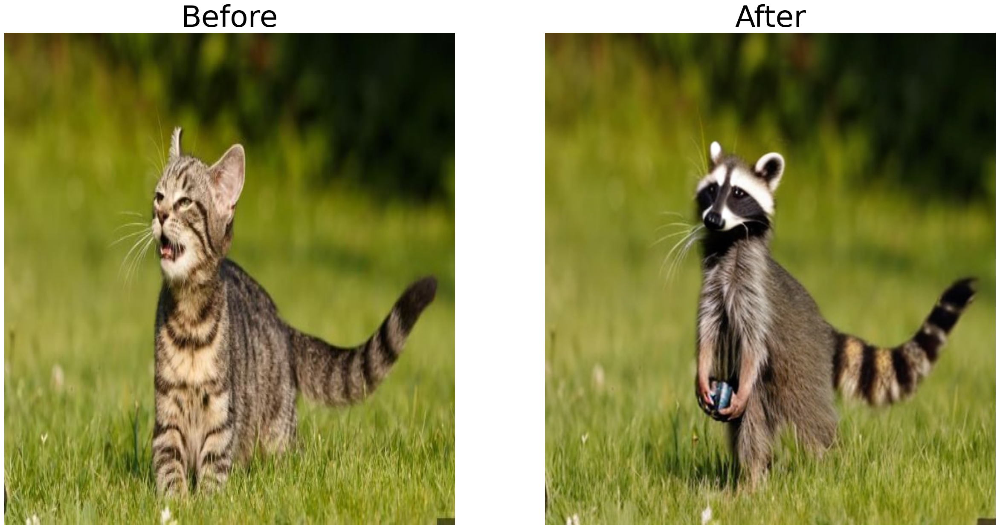

In [33]:
path = '/content/cat_1.JPG'
edited_image = edit_image(path, "cat", "raccoon with an apple in its hands", 0.3, 0.2)
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(plt.imread(path))
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')

axes[1].imshow(edited_image)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()

This notebook is just a copy of Arty Ariuntuya's blog. Credits to her. I just followed her blog and made some changes to remember the concept easily

RESOURCE :
Arty Ariuntuya. (Aug 1, 2023). Using Stable Diffusion and SAM to Modify Image Contents Zero Shot. Roboflow Blog: https://blog.roboflow.com/stable-diffusion-sam-image-edits/